<center><h1>Assignment 2</h1></center>

## Generic environment setup

In [80]:
# assignment main dependencies
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score

In [2]:
# matplotlib plotting config
%matplotlib inline

## Data Preprocessing

First we read the CSV file at hand into a Pandas DataFrame, `df`, via the `read_csv()` method.

In [3]:
df = pd.read_csv("OnlineNewsPopularity/OnlineNewsPopularity.csv")

In [4]:
df.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


Based on the above output, the DataFrame contains 60 + 1 features, of which the target variable is called ' shares'. We observed, that most of the feature names contain a leading white space. To remove that, we apply the strip string method on the DataFrame columns.

In [5]:
df.columns = df.columns.str.strip()

Next, we query descriptive statistics on the DataFrame by the `describe()` method.

In [6]:
df.describe()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,354.530471,10.398749,546.514731,0.548216,0.996469,0.689175,10.883690,3.293638,4.544143,1.249874,...,0.095446,0.756728,-0.259524,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3395.380184
std,214.163767,2.114037,471.107508,3.520708,5.231231,3.264816,11.332017,3.855141,8.309434,4.107855,...,0.071315,0.247786,0.127726,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,11626.950749
min,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1.000000
25%,164.000000,9.000000,246.000000,0.470870,1.000000,0.625739,4.000000,1.000000,1.000000,0.000000,...,0.050000,0.600000,-0.328383,-0.700000,-0.125000,0.000000,0.000000,0.166667,0.000000,946.000000
50%,339.000000,10.000000,409.000000,0.539226,1.000000,0.690476,8.000000,3.000000,1.000000,0.000000,...,0.100000,0.800000,-0.253333,-0.500000,-0.100000,0.150000,0.000000,0.500000,0.000000,1400.000000
75%,542.000000,12.000000,716.000000,0.608696,1.000000,0.754630,14.000000,4.000000,4.000000,1.000000,...,0.100000,1.000000,-0.186905,-0.300000,-0.050000,0.500000,0.150000,0.500000,0.250000,2800.000000
max,731.000000,23.000000,8474.000000,701.000000,1042.000000,650.000000,304.000000,116.000000,128.000000,91.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.500000,1.000000,843300.000000


Above, we see that the number of columns dropped to 60. This is because the `describe()` method cannot do descriptive statistics on a nominal variable, `url`.

Because the URL of a website is irrelevant for our model and analysis, we decided to drop this feature from the dataset.

In [7]:
# drop redundant feature
df = df.drop('url', axis=1)

Below, we learn about the data types of the features by printing out the `dtypes` attribute of the DataFrame.

In [8]:
# get data types of dataframe
print(df.dtypes)

timedelta                        float64
n_tokens_title                   float64
n_tokens_content                 float64
n_unique_tokens                  float64
n_non_stop_words                 float64
n_non_stop_unique_tokens         float64
num_hrefs                        float64
num_self_hrefs                   float64
num_imgs                         float64
num_videos                       float64
average_token_length             float64
num_keywords                     float64
data_channel_is_lifestyle        float64
data_channel_is_entertainment    float64
data_channel_is_bus              float64
data_channel_is_socmed           float64
data_channel_is_tech             float64
data_channel_is_world            float64
kw_min_min                       float64
kw_max_min                       float64
kw_avg_min                       float64
kw_min_max                       float64
kw_max_max                       float64
kw_avg_max                       float64
kw_min_avg      

We can see that all of our data are of type `float`, except for the target variable, 'shares', which is an `int`. We will get to the conversion of the target variable into a categorical variable in a later section.


Inspecting the OnlineNewsPopularity.names support file, as well as the data types we just printed, we see that the dataset contains categorical features. For example, the data channel of the news article, 'data_channel_is_\*', or the day on which the article was published, 'weekday_is_\*'. It is also apparent in the above outputs, that these features have already been converted to a one-hot encoding. Thus, no further conversion is required for the categorical features.

Next, we convert the continuous target variable, 'shares', into a binary variable, based on the below-specified criteria:

$$
shares =
\left\{
	\begin{array}{ll}
		0  & \mbox{if } shares < 1400 \\
		1  &  \mbox{otherwise}
	\end{array}
\right.
$$

In [9]:
# convert target variable to binary
df['shares'] = (df['shares'] >= 1400).astype(int)

In [27]:
print(df['shares'].value_counts(), '\n')
print(df['shares'].describe())

1    21154
0    18490
Name: shares, dtype: int64 

count    39644.000000
mean         0.533599
std          0.498876
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: shares, dtype: float64


Having inspected the newly converted target variable, comparing it to the support file's class distribution, the above output confirms that there are 21154 of class 1 and 18490 of class 0 instances in the dataset.

Next, we create the `target` and `feature` DataFrames, by selecting the relevant columns of the dataset.

In [29]:
# select target and feature column(s)
target_name = 'shares'
target = df[target_name]
feature = df.drop(target_name, axis=1)

# Part _A_

## Models

#### Models' utility functions

In [30]:
def populate_model_scores_to_df(df, mdl_obj, training_data, test_data, col_name="", precision=4):
    """Yield a set of model scores based on a model passed to the function, `mdl_obj`, and the trainig and test set
        The data yielded is populated into a DataFrame, specified by `df` 
        with column name, `col_name`, and `precision` number of decimal precision
    """
  
    X_train, y_train = training_data
    X_test, y_test = test_data
    
    df.loc['Best parameter(s)', col_name] = str(mdl_obj.best_params_)
    df.loc['Best cross-validation score', col_name] = round(mdl_obj.best_score_, precision)
    df.loc['Best Training set score', col_name] = round(mdl_obj.score(X_train, y_train), precision)
    df.loc['Best Test set score', col_name] = round(mdl_obj.score(X_test, y_test), precision)

def populate_eval_metrics_to_df(df, outcomes, col_name="", precision=4):
    """Yield a set of evaluation metrics of based on the `outcomes` tuple, which 
        contains the true values and predictions respectively
        The data yielded is populated into a DataFrame, specified by `df` 
        with column name, `col_name`, and `precision` number of decimal precision
    """
    
    y_true, y_pred = outcomes
    
    df.loc['Accuracy', col_name] = round(accuracy_score(y_true, y_pred), precision)
    df.loc['Macro-Averaged Precision', col_name] = round(precision_score(y_true, y_pred, average='macro'), precision)
    df.loc['Micro-Averaged Precision', col_name] = round(precision_score(y_true, y_pred, average='micro'), precision)
    df.loc['Recall', col_name] = round(recall_score(y_true, y_pred), precision)
    df.loc['F1 Score', col_name] = round(f1_score(y_true, y_pred), precision)

def build_model(mdl_obj, scaler, param_grid, training_data):
    """Make a pipeline out of a scaler and a Machine Learning model passed to the function.
    After then, Grid Search with a 10-fold cross-validation is performed on a parameter
    grid passed to the function, `param_grid`
    Then the model is fitted on the training data, and the GridSearchCV output is returned
    """
    
    X_train, y_train = training_data
    
    pipeline = make_pipeline(scaler, mdl_obj)
    grid_search = GridSearchCV(pipeline, param_grid, cv=10)
    grid_search.fit(X_train, y_train)
    return grid_search

#### Splitting the data into training set and test set

In [31]:
from sklearn.model_selection import train_test_split

# split data into a training and test set
X_train, X_test, y_train, y_test = train_test_split(feature, target, random_state=8)

print("trainig set size: {}\ntest set size: {}".format(y_train.shape[0], y_test.shape[0]))

training_data = (X_train, y_train)
test_data = (X_test, y_test)

trainig set size: 29733
test set size: 9911


Below, we begin creating the machine learning models used for the task, but first, we introduce the scores used to evaluate the models.

### Evaluation metrics used

__Accuracy:__ The ratio of the number of news articles that were correctly classified as popular and the total number of predictions the model made. That is, $\text{accuracy} = \frac{\text{TP} + \text{TN}}{\text{TP} + \text{TN} + \text{FP} + \text{FN}}$

__Precision:__ Measures how many of the news articles predicted as popular are actually popular. That is, $\text{precision} = \frac{\text{TP}}{\text{TP} + \text{FP}}$

When a precision is macro-averaged, the model calculates metrics for each label (in this case for 0 and 1), and find their unweighted mean.

When precision is micro-averaged, the model calculate metrics for each label, and find their average weighted by support (the number of true instances for each label).

__Recall:__ Measures how many of the popular news articles captured by the correct prediction. That is, $\text{recall} = \frac{\text{TP}}{\text{TP} + \text{FN}}$

__F1 score:__ The harmonic mean of precision and recall. That is, $\text{F1} = 2 \times \frac{\text{precision } \times \text{ recall}}{\text{precision } + \text{ recall}}$

### Linear SVC

In [14]:
from sklearn.svm import LinearSVC

linearsvc_scores_df = pd.DataFrame()
param_grid = {'linearsvc__C': [10 ** n for n in range(-3, 4)]}
scaler = [('Unscaled', None),
          ('MinMaxScaler', MinMaxScaler()),
          ('StandardScaler', StandardScaler())]

for scl_name, scl_obj in scaler:
    linearsvc = build_model(LinearSVC(), scl_obj, param_grid, training_data)
    y_pred = linearsvc.predict(X_test)
    populate_model_scores_to_df(linearsvc_scores_df, linearsvc, training_data, test_data, scl_name)
    populate_eval_metrics_to_df(linearsvc_scores_df, (y_test, y_pred), scl_name)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increas

#### Observations

In [15]:
linearsvc_scores_df

,Unscaled,MinMaxScaler,StandardScaler
Best parameter(s),{'linearsvc__C': 1000},{'linearsvc__C': 10},{'linearsvc__C': 0.01}
Best cross-validation score,0.5213,0.6526,0.6537
Best Training set score,0.5588,0.6537,0.6544
Best Test set score,0.5544,0.6533,0.6539
Accuracy,0.5544,0.6533,0.6539
Macro-Averaged Precision,0.5756,0.6521,0.6522
Micro-Averaged Precision,0.5544,0.6533,0.6539
Recall,0.3845,0.6669,0.6919
F1 Score,0.479,0.6721,0.6805


Inspecting the results table, we can see that the unscaled model provide significantly lower accuracy and precision scores compared to the scaled models (0.55 vs 0.65). In terms of recall, the difference is even larger (0.38 for the unscaled model vs 0.67 and 0.69 for the scaled models. While these results show the importance of scaling, we also see little to no difference between the two types of scaling methods.

### Logistic Regression

In [16]:
from sklearn.linear_model import LogisticRegression

logreg_scores_df = pd.DataFrame()
param_grid = {'logisticregression__C': [10 ** n for n in range(-3, 4)]}
scaler = [('Unscaled', None),
          ('MinMaxScaler', MinMaxScaler()),
          ('StandardScaler', StandardScaler())]

for scl_name, scl_obj in scaler:
    logreg = build_model(LogisticRegression(), scl_obj, param_grid, training_data)
    y_pred = logreg.predict(X_test)
    populate_model_scores_to_df(logreg_scores_df, logreg, training_data, test_data, scl_name)
    populate_eval_metrics_to_df(logreg_scores_df, (y_test, y_pred), scl_name)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

#### Observations

In [17]:
logreg_scores_df

,Unscaled,MinMaxScaler,StandardScaler
Best parameter(s),{'logisticregression__C': 1000},{'logisticregression__C': 1000},{'logisticregression__C': 10}
Best cross-validation score,0.592,0.6521,0.6541
Best Training set score,0.5924,0.6526,0.6562
Best Test set score,0.5874,0.6486,0.6536
Accuracy,0.5874,0.6486,0.6536
Macro-Averaged Precision,0.5843,0.6467,0.6519
Micro-Averaged Precision,0.5874,0.6486,0.6536
Recall,0.6786,0.69,0.6922
F1 Score,0.6367,0.6766,0.6804


Similarly to LinearSVC, with the Logistic Regression model, the scaled models provide higher accuracy and precision, but the difference is smaller than in the case of the LinearSVC. Also, recall scores are almost identical with or without scaling (0.678 unscaled and 0.69 scaled). Seemingly, the Logistic Regression model isn't as sensitive to unscaled data as the LinearSVC is.

### k-Nearest Neighbors

In [36]:
from sklearn.neighbors import KNeighborsClassifier

knn_scores_df = pd.DataFrame()
param_grid = {"kneighborsclassifier__n_neighbors": [1] + list(range(10, 101, 10))}
scaler = [('Unscaled', None),
          ('MinMaxScaler', MinMaxScaler()),
          ('StandardScaler', StandardScaler())]

for scl_name, scl_obj in scaler:
    knn = build_model(KNeighborsClassifier(), scl_obj, param_grid, training_data)
    y_pred = knn.predict(X_test)
    populate_model_scores_to_df(knn_scores_df, knn, training_data, test_data, scl_name)
    populate_eval_metrics_to_df(knn_scores_df, (y_test, y_pred), scl_name)

#### Observations

In [38]:
knn_scores_df

,Unscaled,MinMaxScaler,StandardScaler
Best parameter(s),{'kneighborsclassifier__n_neighbors': 60},{'kneighborsclassifier__n_neighbors': 100},{'kneighborsclassifier__n_neighbors': 100}
Best cross-validation score,0.5908,0.635,0.6401
Best Training set score,0.6145,0.6417,0.6504
Best Test set score,0.5921,0.6386,0.6476
Accuracy,0.5921,0.6386,0.6476
Macro-Averaged Precision,0.5898,0.6369,0.6466
Micro-Averaged Precision,0.5921,0.6386,0.6476
Recall,0.6301,0.6663,0.6545
F1 Score,0.622,0.6626,0.6643


Again, the importance of scaling the data is apparent when evaluating the different kNN models. The MinMaxScaler provides an approximately 4 percentage point increase in accuracy and precision compared to the unscaled model, with the StandardScaler giving another extra 1 percentage point increase. However, the MinMaxScaler provides the highest recall score out of the three models.

# Part _B_

### DecisionTreeClassifier

#### a) Fit the classifier on the data and report the model accuracy.

In [120]:
from sklearn.tree import DecisionTreeClassifier

tree_scores_df = pd.DataFrame()

tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)
y_pred = tree.predict(X_test)
populate_eval_metrics_to_df(tree_scores_df, (y_test, y_pred), "Decision Tree")
print("Decision tree accuracy: {}".format(tree_scores_df.loc["Accuracy", "Decision Tree"]))

Decision tree accuracy: 0.5727


#### b) Report all evaluation metrics listed in Section 3.

In [43]:
tree_scores_df

,Decision Tree
Accuracy,0.5793
Macro-Averaged Precision,0.5778
Micro-Averaged Precision,0.5793
Recall,0.5979
F1 Score,0.6023


#### c) Are these models resilient to overfitting when model hyperparameters have not been carefully selected?

Without specifying the parameters of the `DecisionTreeClassifier`, the recursive partitioning of the data is repeated until pure leaves are yielded, as per below.

In [49]:
import graphviz
from sklearn.tree import export_graphviz
tree_dot = export_graphviz(tree, out_file=None, feature_names=feature.columns)
graphviz.Source(tree_dot)

To see if there is any overfitting, we inspect the accuracy scores on the training and test sets.

In [113]:
print("Decision Tree Training Score: {:.4f}".format(tree.score(X_train, y_train)))
print("Decision Tree Test Score: {:.4f}".format(tree.score(X_test, y_test)))

Decision Tree Training Score: 1.0000
Decision Tree Test Score: 0.5713


The extent of the fully grown tree diagram, and the 0.0 Gini Index of the leaves, as well as the training and test score refer to severe overfitting and poor generalisability.

Below we plot the mean training and test scores that the a particular tree depth limitation yields.

<AxesSubplot: xlabel='param_max_depth'>

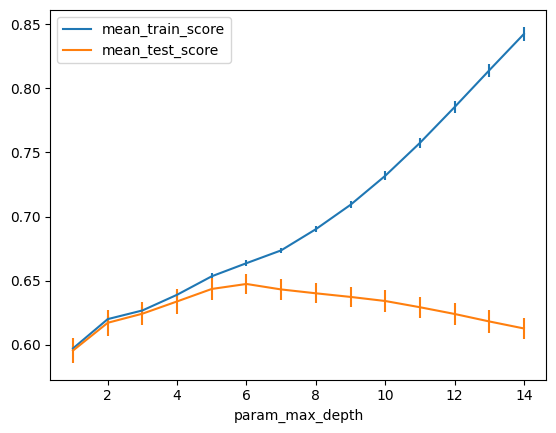

In [108]:
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit
param_grid = {'max_depth':range(1, 15)}
grid = GridSearchCV(DecisionTreeClassifier(random_state=0), param_grid=param_grid, cv=StratifiedShuffleSplit(100), return_train_score=True)
grid.fit(X_train, y_train)

scores = pd.DataFrame(grid.cv_results_)
scores.plot(x='param_max_depth', y='mean_train_score', yerr='std_train_score', ax=plt.gca())
scores.plot(x='param_max_depth', y='mean_test_score', yerr='std_test_score', ax=plt.gca())

Based on the above plot, we can see that as 'max_depth' increases, so as the training set score. However, the test score reaches its local maxima at 'max_depth' of 6, and after then it declines. Therefore, we can conclude, that the model by default is not resilient to overfitting, and hence thorough Grid Search is required to avoid overfitting.

#### d) Perform a grid search on the decision tree model parameters [‘max depth’, ‘max features’] to evaluate the optimal values for these parameters

In [102]:
# applying rule of thumb: max_features = sqrt(n_features)
max_feat_upper_bound = round(len(feature.columns) ** 0.5) + 1

param_grid = {'max_depth':range(1, 6), 'max_features':range(1, max_feat_upper_bound)}
grid = GridSearchCV(DecisionTreeClassifier(random_state=8), param_grid=param_grid, cv=10, return_train_score=True)
grid.fit(X_train, y_train)
print("Best parameters: {}".format(grid.best_params_))

Best parameters: {'max_depth': 5, 'max_features': 7}


In [116]:
# build model with best decision tree parameters
optimum_tree_scores_df = pd.DataFrame()

optimum_tree = DecisionTreeClassifier(random_state=8)
optimum_tree.set_params(**grid.best_params_)
optimum_tree.fit(X_train, y_train)
optimum_y_pred = optimum_tree.predict(X_test)
populate_eval_metrics_to_df(optimum_tree_scores_df, (y_test, optimum_y_pred), f"Decision Tree w/ w/ {str(grid.best_params_)}")

In [117]:
optimum_tree_scores_df

,"Decision Tree w/ max_depth=5, max_features=7"
Accuracy,0.6509
Macro-Averaged Precision,0.6496
Micro-Averaged Precision,0.6509
Recall,0.7199
F1 Score,0.6872


With the optimum parameters that the Grid Search yielded, we see a significant increase in the model evaluation metrics, which refers to a higher quality model.

### RandomForestClassifier

#### a) Fit the classifier on the data and report the model accuracy.

In [122]:
from sklearn.ensemble import RandomForestClassifier

rf_scores_df = pd.DataFrame()

rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
populate_eval_metrics_to_df(rf_scores_df, (y_test, y_pred), "Random Forest")
print("Random Forest accuracy: {}".format(rf_scores_df.loc["Accuracy", "Random Forest"]))

Random Forest accuracy: 0.6654


#### b) Report all evaluation metrics listed in Section 3.

In [124]:
rf_scores_df

,Random Forest
Accuracy,0.6654
Macro-Averaged Precision,0.6639
Micro-Averaged Precision,0.6654
Recall,0.7152
F1 Score,0.6949


#### c)

1) __How are decision tree classifiers different from random forests on a structural level?__

A decision tree is a single binary decision tree, while the random forest is an ensemble of binary decision trees.

2) __Where would you choose decision trees over random forests and vice-versa? Demonstrate this using an appropriate example from your data.__

Since the training of a single decision tree is faster than that of multiples, it is a more suitable machine learning method for large data sets. Also, when interpretation and/or visualisation are an important factor, then decision trees are preferred over random forests. On the other hand, when it comes to accuracy and precision, random forests are a better choice over decision trees. 

3) __Is accuracy an appropriate evaluation metric for this classification task?__

Accuracy is an appropriate evaluation metric for this classification task, because the dataset at hand is approximately balanced (~53.3% is of class 1, and ~46.7% class 0).

#### d) Perform a grid search on the random forest model parameters [‘max depth’, ‘max features’ ‘n estimators’] to evaluate the optimal values for these parameters.

In [125]:
param_grid = {'max_depth':range(1, 6), 'max_features':range(1, max_feat_upper_bound), 'n_estimators':range(1, 102, 5)}

rf_grid_searched_scores_df = pd.DataFrame()

rf_grid = GridSearchCV(RandomForestClassifier(), param_grid=param_grid, cv=10)
rf_grid.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=RandomForestClassifier(),
             param_grid={'max_depth': range(1, 6), 'max_features': range(1, 9),
                         'n_estimators': range(1, 102, 5)})

In [126]:
print("Best parameters: {}".format(rf_grid.best_params_))

Best parameters: {'max_depth': 5, 'max_features': 6, 'n_estimators': 41}


In [127]:
# build model with best random forest parameters
optimum_rf_scores_df = pd.DataFrame()

optimum_rf = RandomForestClassifier(random_state=8)
optimum_rf.set_params(**rf_grid.best_params_)
optimum_rf.fit(X_train, y_train)
optimum_rf_y_pred = optimum_rf.predict(X_test)
populate_eval_metrics_to_df(optimum_rf_scores_df, (y_test, optimum_rf_y_pred), f"Random Forest w/ {str(rf_grid.best_params_)}")

In [129]:
optimum_rf_scores_df

,"Random Forest w/ {'max_depth': 5, 'max_features': 6, 'n_estimators': 41}"
Accuracy,0.6527
Macro-Averaged Precision,0.6542
Micro-Averaged Precision,0.6527
Recall,0.7614
F1 Score,0.7002


With the optimum parameters that the Grid Search yielded, we see a modest increase recall and the F1 score.

In [ ]:
train_scores = []
test_scores = []

rf = RandomForestClassifier(warm_start=True)
estimator_range = range(1, 100, 1)
for n_estimators in estimator_range:
    rf.n_estimators = n_estimators
    rf.fit(X_train, y_train)
    train_scores.append(rf.score(X_train, y_train))
    test_scores.append(rf.score(X_test, y_test))
    
plt.plot(estimator_range, test_scores, label="train scores")
plt.plot(estimator_range, train_scores, label="train scores")
plt.ylabel("accuracy")
plt.xlabel("n_estimators")
plt.legend()